<a href="https://colab.research.google.com/github/priyarane879/E-Commerce-Customer-Segmentation/blob/main/ML_Capstone_1_Part_3(priya_naik).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML Capstone 1 - Part 3 E-Commerce Customer Segmentation

## TODO

### Clustering Algorithms for Customer Segmentation
- Applying unsupervised learning algorithms (e.g., K-means clustering, Hierarchical clustering) to segment customers
- Determining the optimal number of clusters using techniques such as the elbow method or silhouette score
- Interpreting customer segments based on cluster characteristics and feature importance
- Visualize the clusters using PCA

### Classification for Segment Prediction (8 pts)
- Using any of the supervised learning classification algorithms (e.g., Random Forest, Gradient Boosting, Logistic Regression) predict customer segments:

    - Split the dataset into training, validation and test sets
    - Training classification models to predict the segment to which a customer belongs
    - Validating the classification model's performance and generalization using cross-validation techniques
    - Evaluating model performance using appropriate metrics (e.g., accuracy, precision, recall, F1-score)
    - Iteratively refining segmentation and classification strategies based on validation results and stakeholder feedback


### Grading and Important Instructions
- Each of the above steps are mandatory and should be completed in good faith
- Make sure before submitting that the code is in fully working condition
- It is fine to make use of ChatGPT, stackoverflow type resources, just provide the reference links from where you got it
- Debugging is an art, if you find yourself stuck with errors, take help of stackoverflow and ChatGPT to resolve the issue and if it's still unresolved, reach out to me for help.
- You need to score atleast 7/10 to pass the project, anything less than that will be marked required, needing resubmission.
- Feedback will be provided on 3 levels (Awesome, Suggestion, & Required). Required changes are mandatory to be made.
- For submission, please upload the project on github and share the link to the file with us through LMS.

#### Write your code below and do not delete the above instructions

In [44]:
#importing libraries
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_samples, silhouette_score
import scipy.cluster.hierarchy as sch

from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost import XGBClassifier
from xgboost import XGBRFClassifier
from sklearn.tree import export_graphviz
from prettytable import PrettyTable

In [45]:
#connecting to google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [46]:
df_RFM=pd.read_csv('/content/drive/MyDrive/Elevate Pro/ML/ecommerce_data_new.csv')

In [47]:
df_RFM

,CustomerID,Recency,Frequency,Total_amount,R,F,M
0,12346,325,1,77183.60,161.0,4303.5,10.0
1,12347,1,182,4310.00,4203.5,511.5,335.0
2,12348,74,31,1797.24,1653.0,2502.0,1004.0
3,12349,18,73,1757.55,3182.0,1428.5,1027.0
4,12350,309,17,334.40,230.5,3257.0,3097.0
...,...,...,...,...,...,...,...
4334,18280,277,10,180.60,353.0,3717.5,3768.0
4335,18281,180,7,80.82,859.5,3933.0,4235.0
4336,18282,7,12,178.05,3795.5,3571.0,3788.0
4337,18283,3,721,2045.53,4016.0,31.5,874.0


In [48]:
df_RFM.drop(['Recency','Frequency','Total_amount'],axis=1,inplace=True) # deleting column Recency, Frequency,Total_amount


In [49]:
columns = ['R', 'F', 'M']

# Standardize the feature values

df_RFM[columns] = StandardScaler().fit_transform(df_RFM[columns].values)

I use StandardScaler to scale the data so that all features have a mean of 0 and a standard deviation of 1.

In [50]:
X=df_RFM[columns]

The elbow method graph shows the sum of squared distances (SSE) for different numbers of clusters (k). The optimal k is typically found at the "elbow point," where the SSE starts to level off.

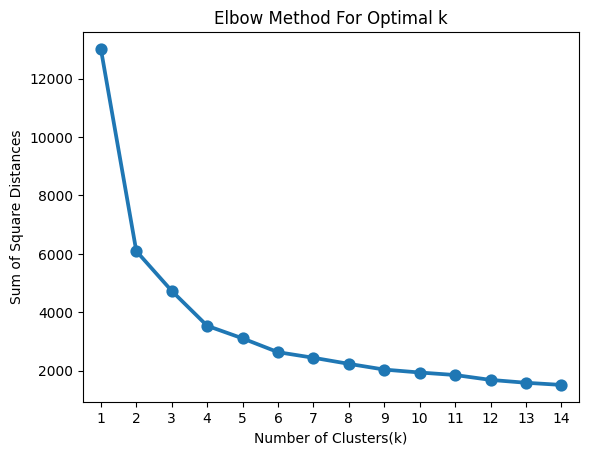

In [51]:
from sklearn.cluster import KMeans

sum_of_sq_dist = {}
for k in range(1,15):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(X)
    sum_of_sq_dist[k] = km.inertia_

#Plot the graph for the sum of square distance values and Number of Clusters
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Observation:-
* The optimal number of clusters (k) is around 3 or 4, as the "elbow" (where the curve bends) is visible at that point.

Silhouette score is used to evaluate the quality of clusters created using clustering algorithms such as K-Means in terms of how well samples are clustered with other samples that are similar to each other.

In [52]:
range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(X)
    centers = clusterer.cluster_centers_

    score = silhouette_score(X, preds)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.4369026077861595
For n_clusters = 3, silhouette score is 0.3326057458071569
For n_clusters = 4, silhouette score is 0.36530901954685335
For n_clusters = 5, silhouette score is 0.31096667628928887
For n_clusters = 6, silhouette score is 0.3240960391815013
For n_clusters = 7, silhouette score is 0.30928196258720897
For n_clusters = 8, silhouette score is 0.30937631574313496
For n_clusters = 9, silhouette score is 0.2938362438975562
For n_clusters = 10, silhouette score is 0.29693154397393284
For n_clusters = 11, silhouette score is 0.2931876024786249
For n_clusters = 12, silhouette score is 0.2980091438659671
For n_clusters = 13, silhouette score is 0.2822749179925485
For n_clusters = 14, silhouette score is 0.2862974500513905
For n_clusters = 15, silhouette score is 0.28629648860079604


Observation:-
* k = 2 has the highest silhouette score.

In [53]:
# ML Model - 1 Implementation
kmeans = KMeans(n_clusters=2)
# Fit the Algorithm
kmeans.fit(X)

# Predict on the model
y_kmeans = kmeans.predict(X)


For n_clusters = 2 The average silhouette_score is : 0.4369829497355483


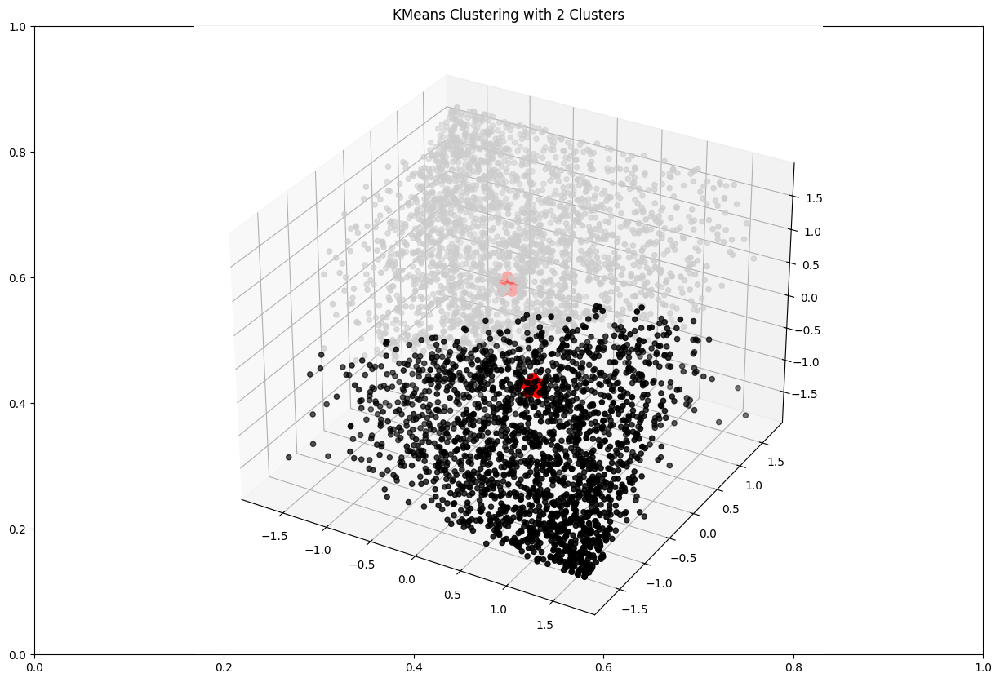

For n_clusters = 3 The average silhouette_score is : 0.3309202157132917


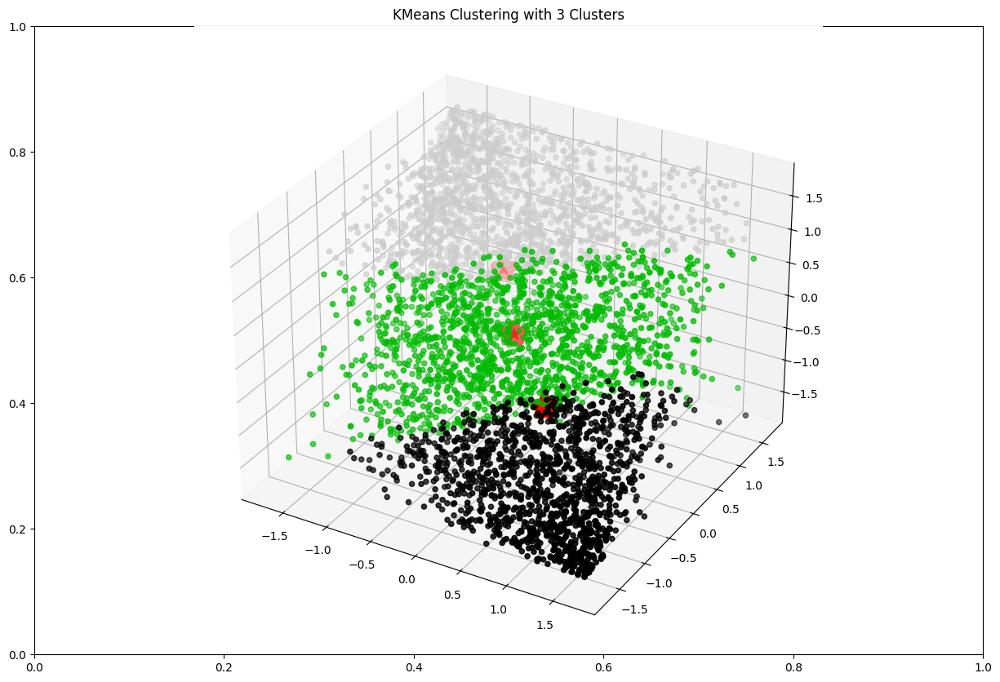

For n_clusters = 4 The average silhouette_score is : 0.3657683420270364


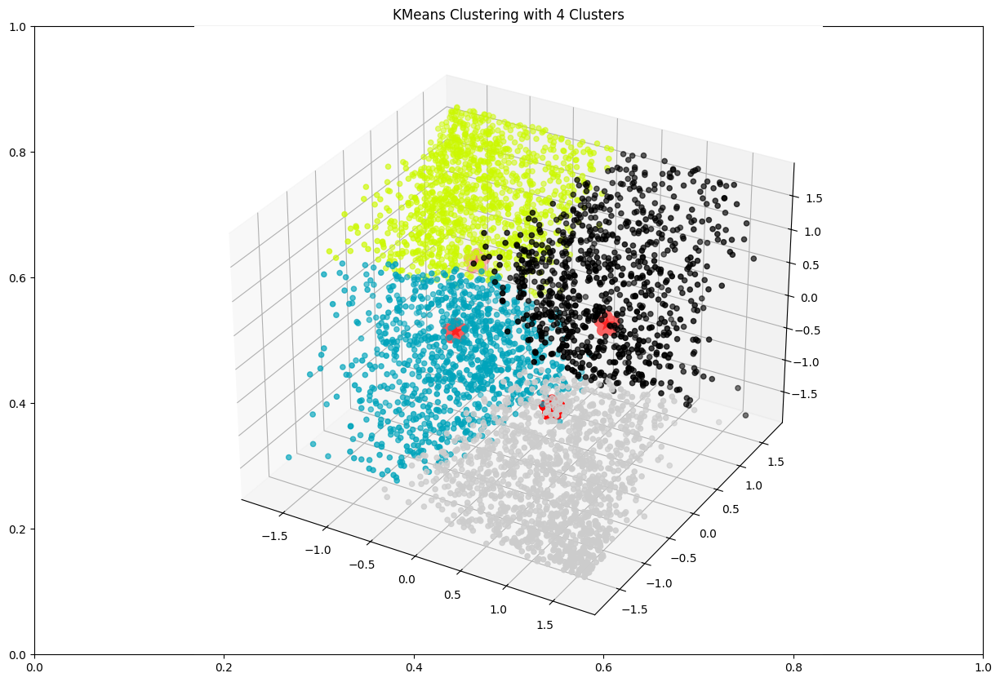

For n_clusters = 5 The average silhouette_score is : 0.31141653569534505


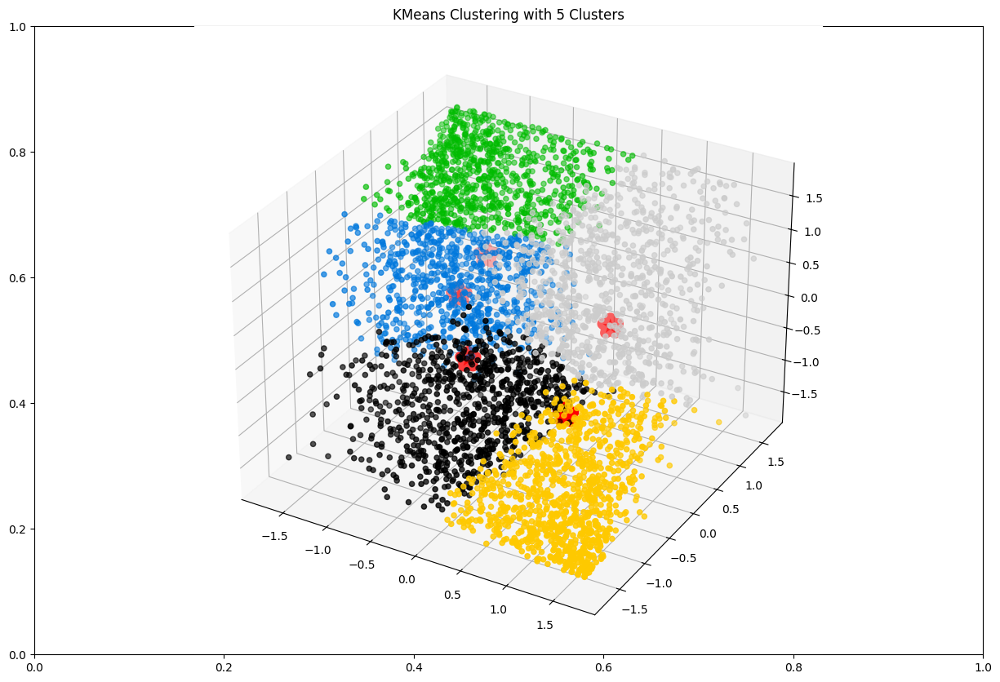

For n_clusters = 6 The average silhouette_score is : 0.32389094717058864


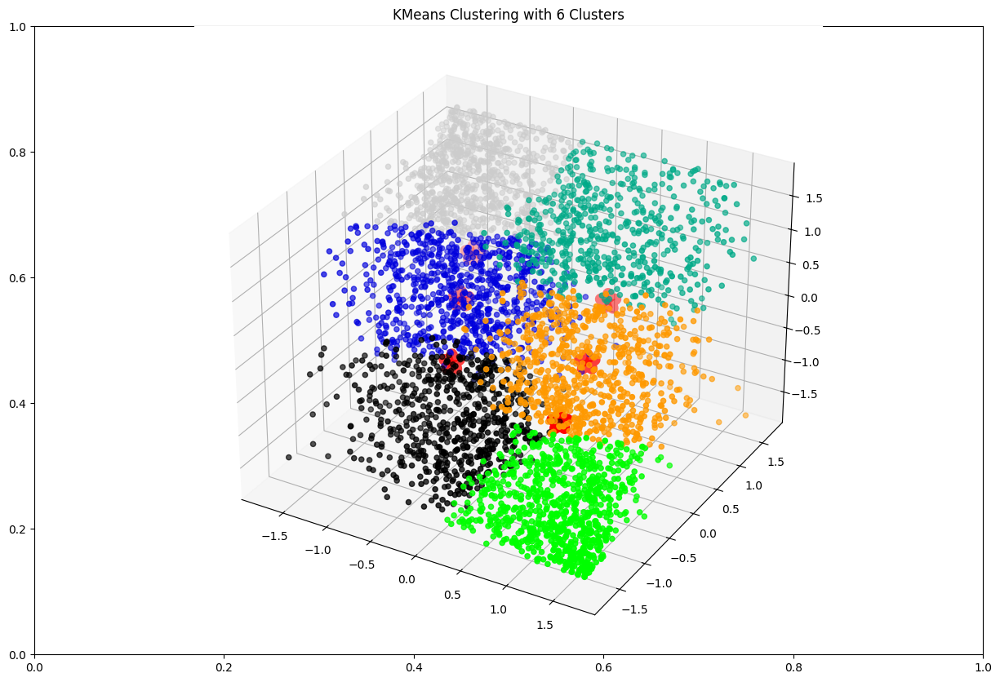

For n_clusters = 7 The average silhouette_score is : 0.3002355881217926


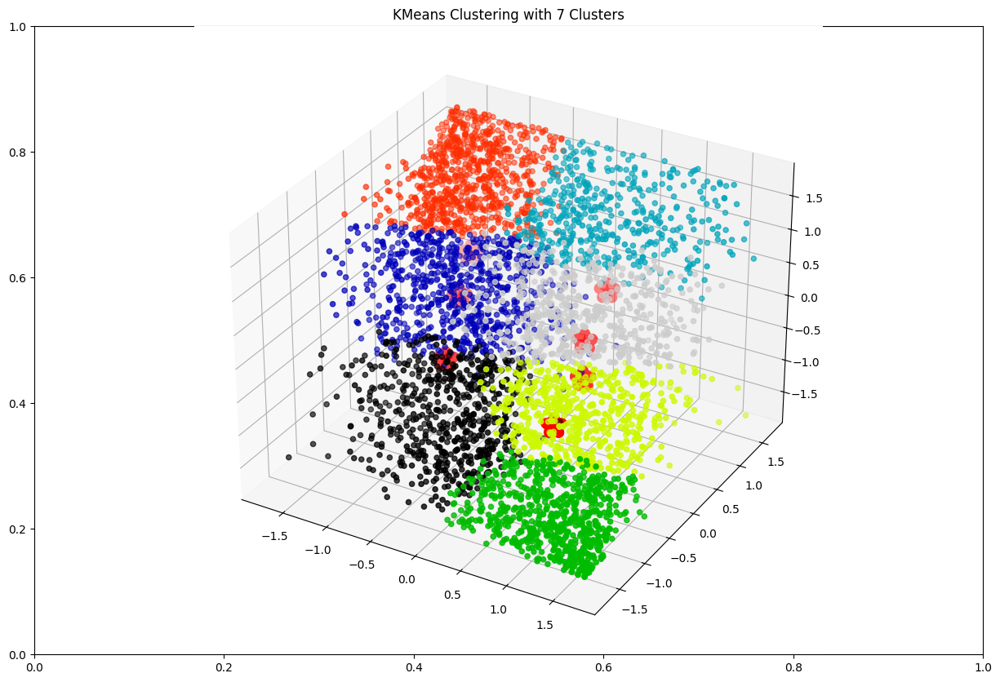

For n_clusters = 8 The average silhouette_score is : 0.2925593660399635


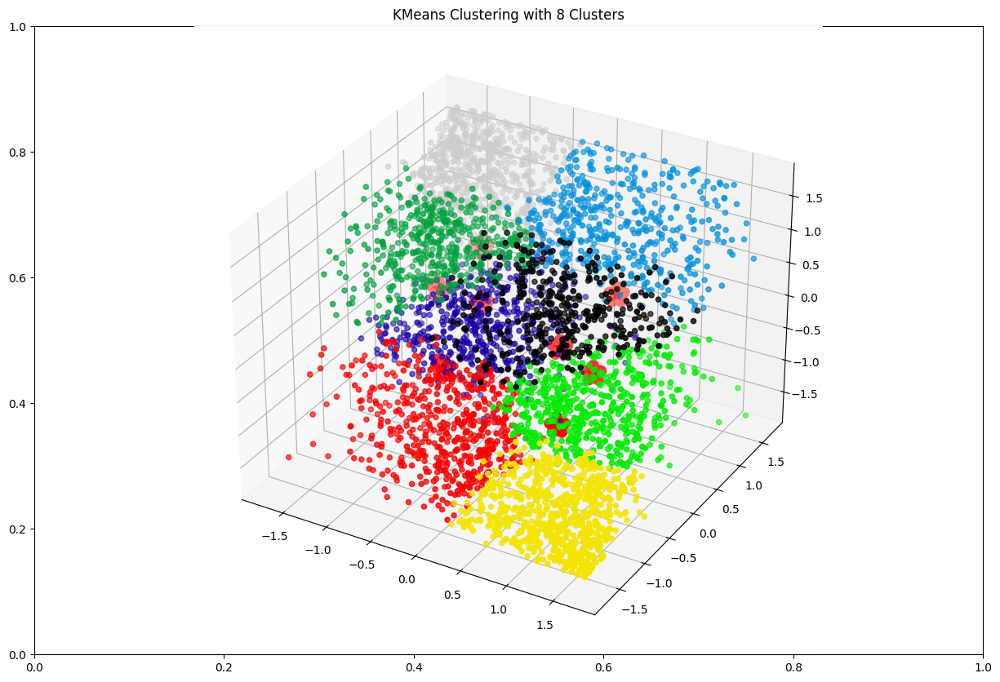

For n_clusters = 9 The average silhouette_score is : 0.2906863719718168


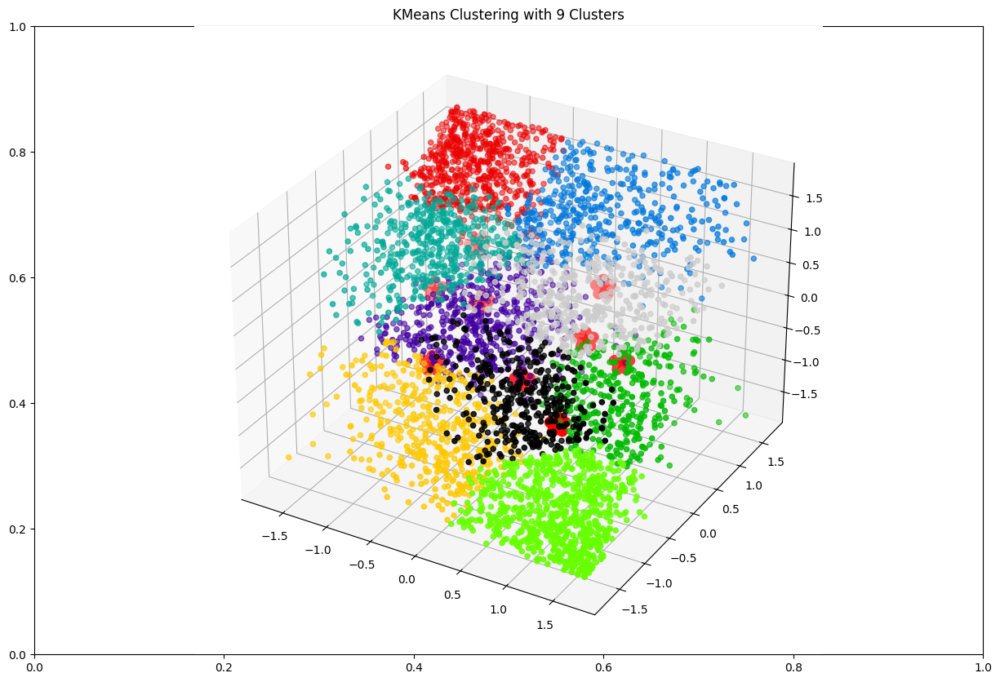

For n_clusters = 10 The average silhouette_score is : 0.2998423350519249


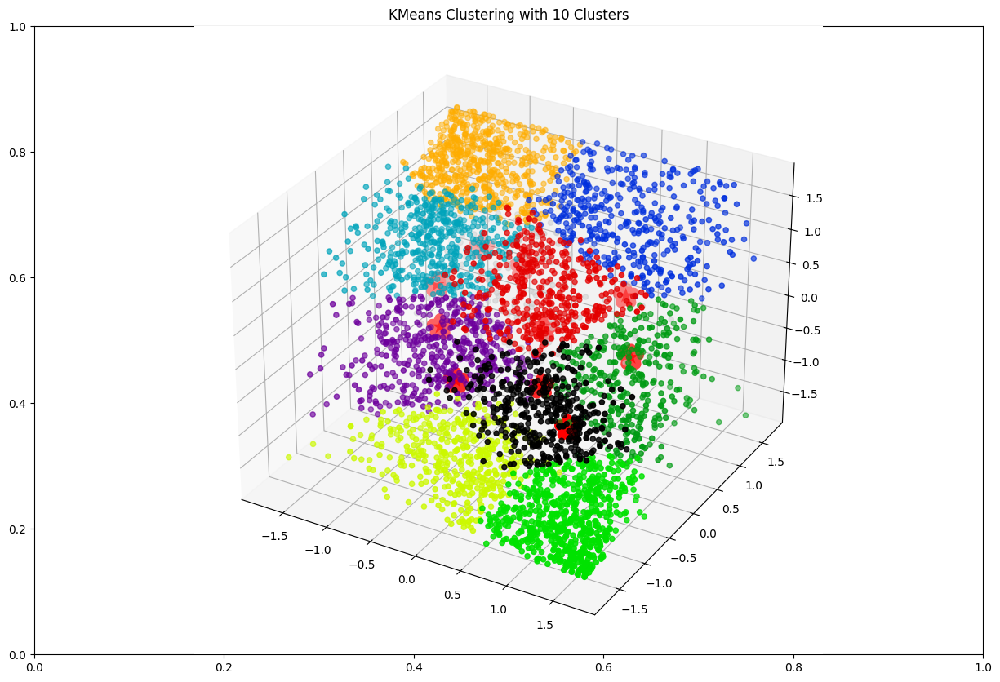

For n_clusters = 11 The average silhouette_score is : 0.2937728677417193


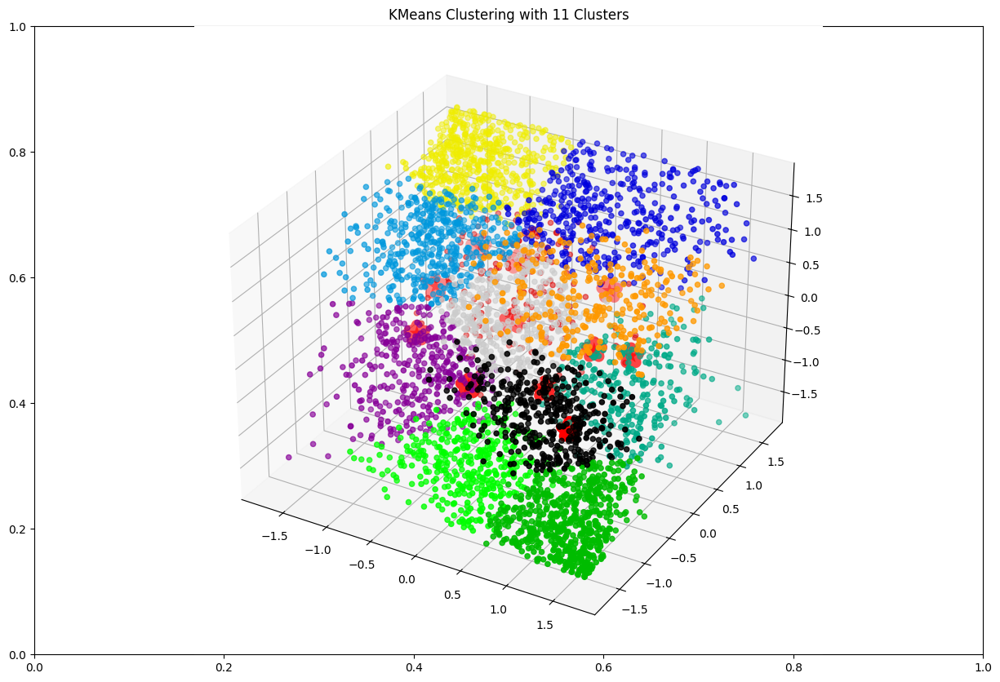

For n_clusters = 12 The average silhouette_score is : 0.2956339717479203


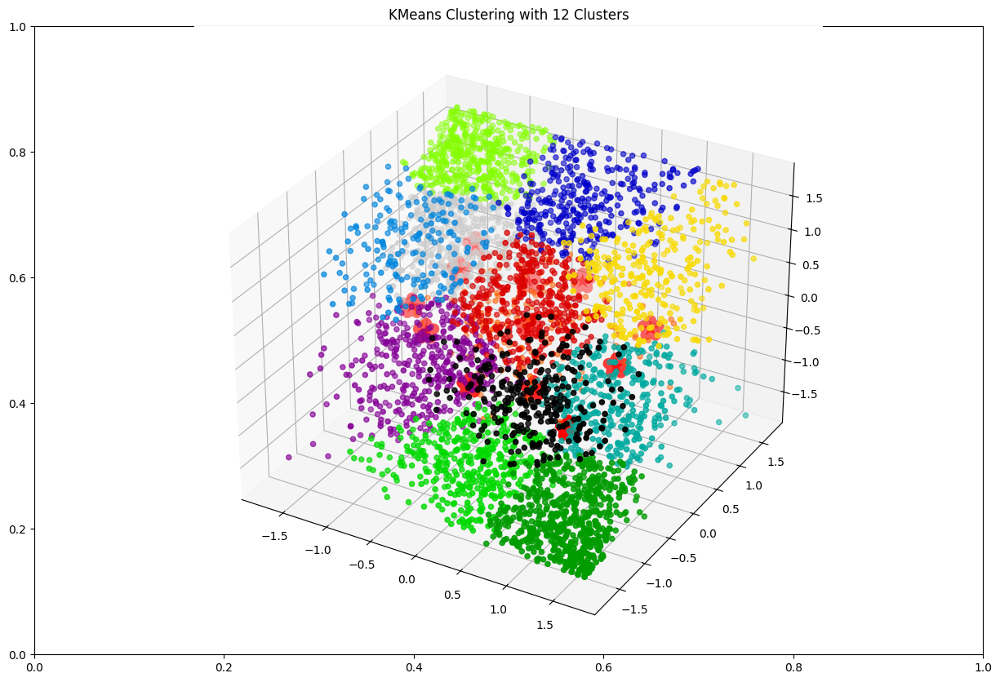

For n_clusters = 13 The average silhouette_score is : 0.2940810805309837


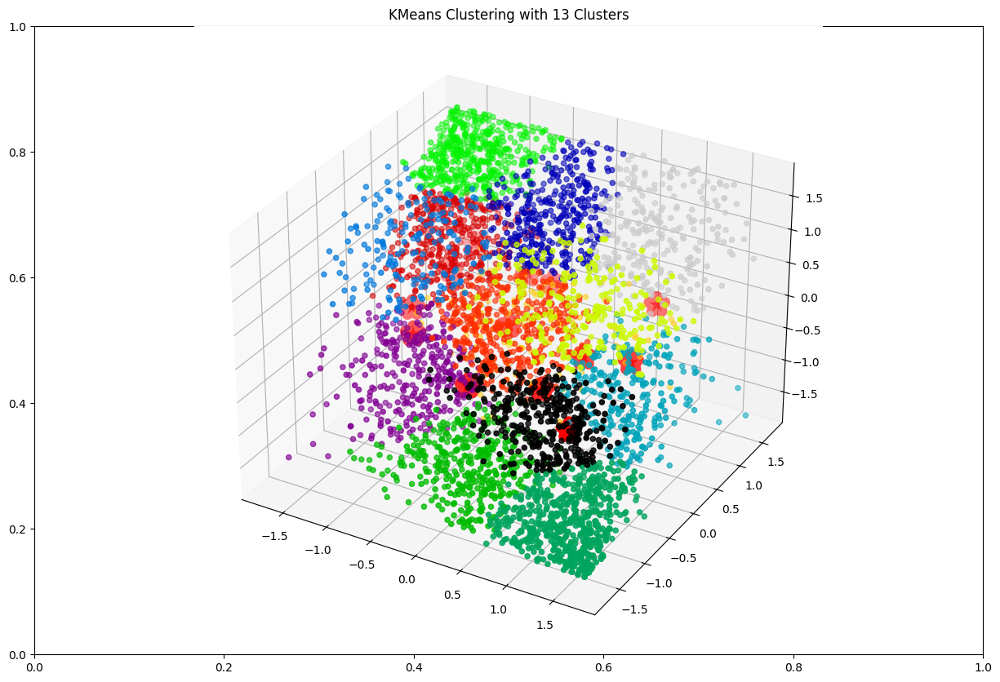

For n_clusters = 14 The average silhouette_score is : 0.28218450069224227


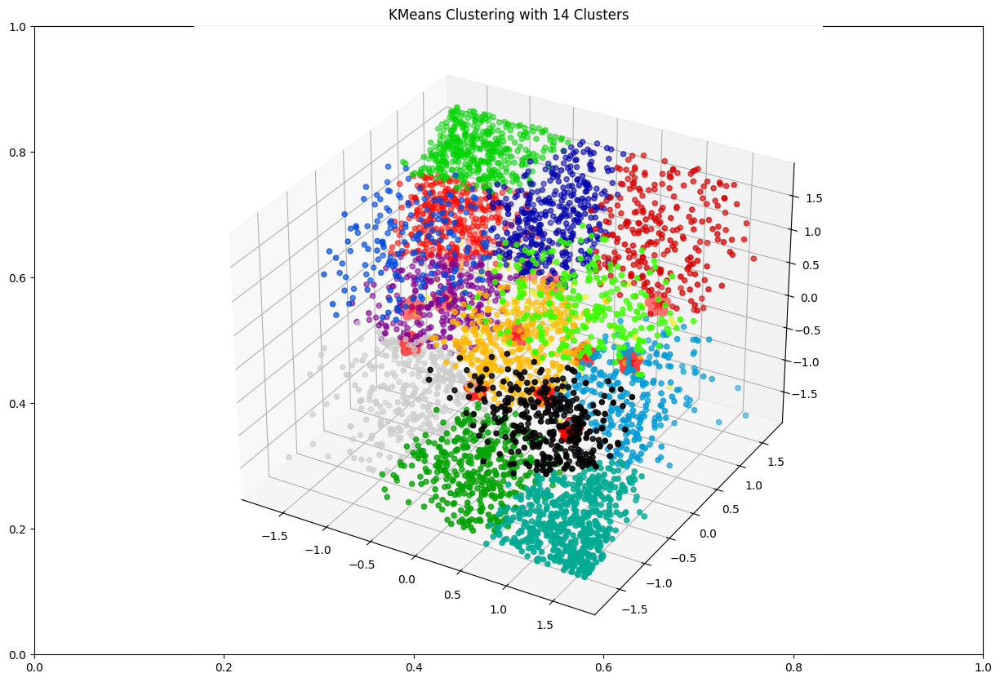

For n_clusters = 15 The average silhouette_score is : 0.26772139611981954


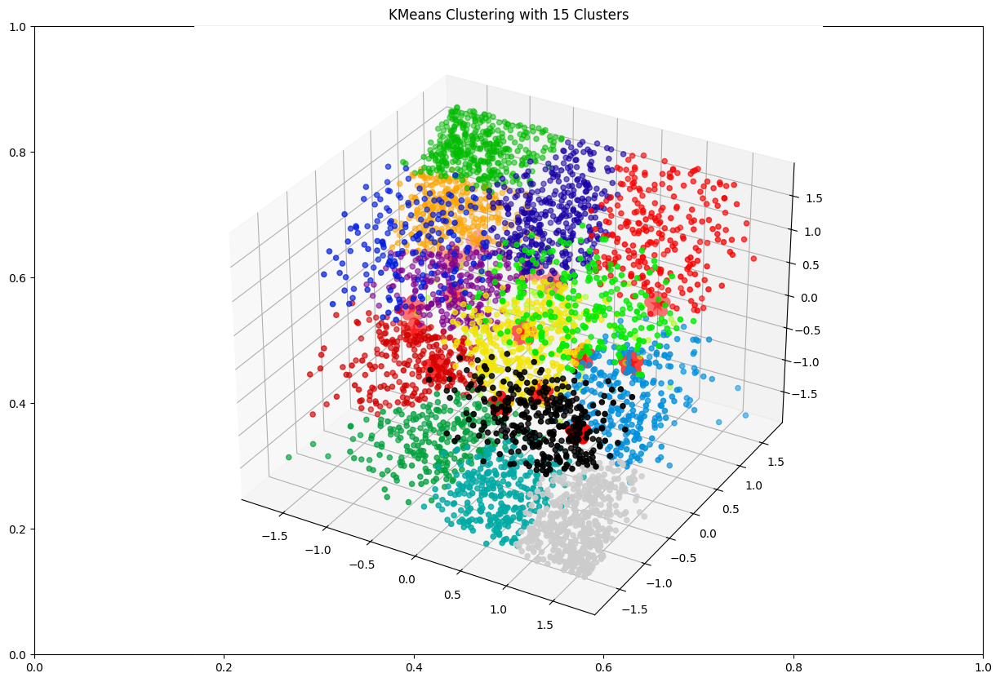

For n_clusters = 16 The average silhouette_score is : 0.2889883195684561


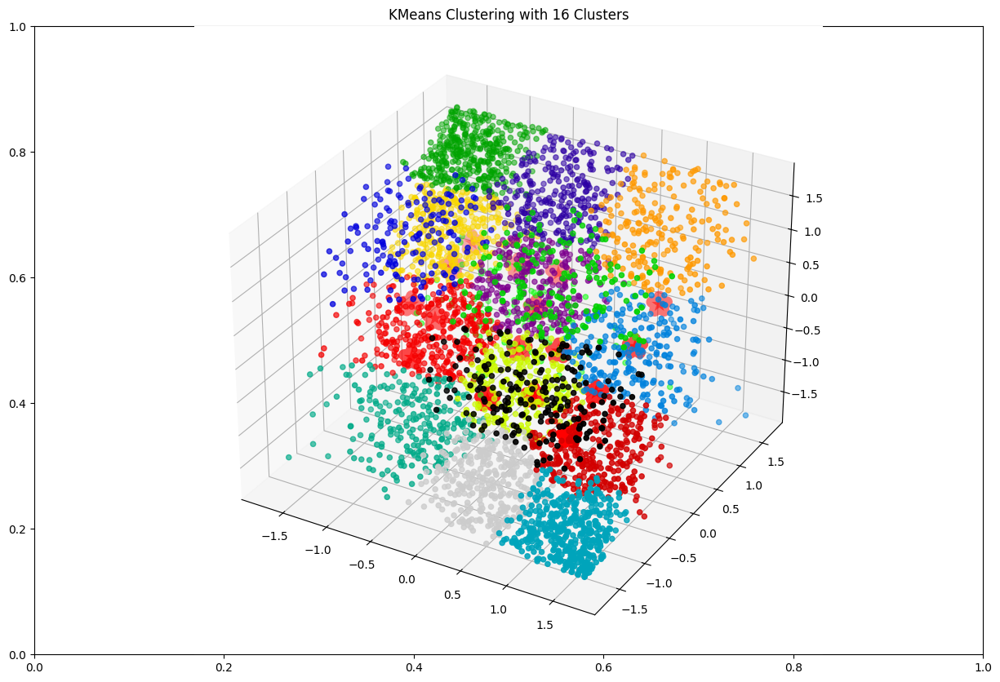

For n_clusters = 17 The average silhouette_score is : 0.28037992369658593


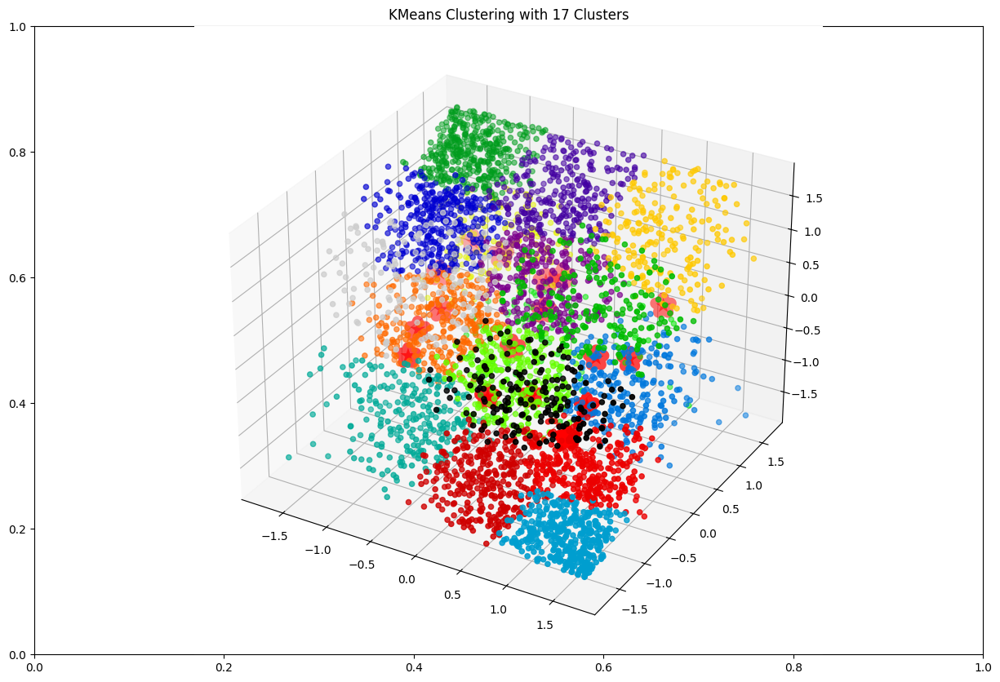

For n_clusters = 18 The average silhouette_score is : 0.27000743906338914


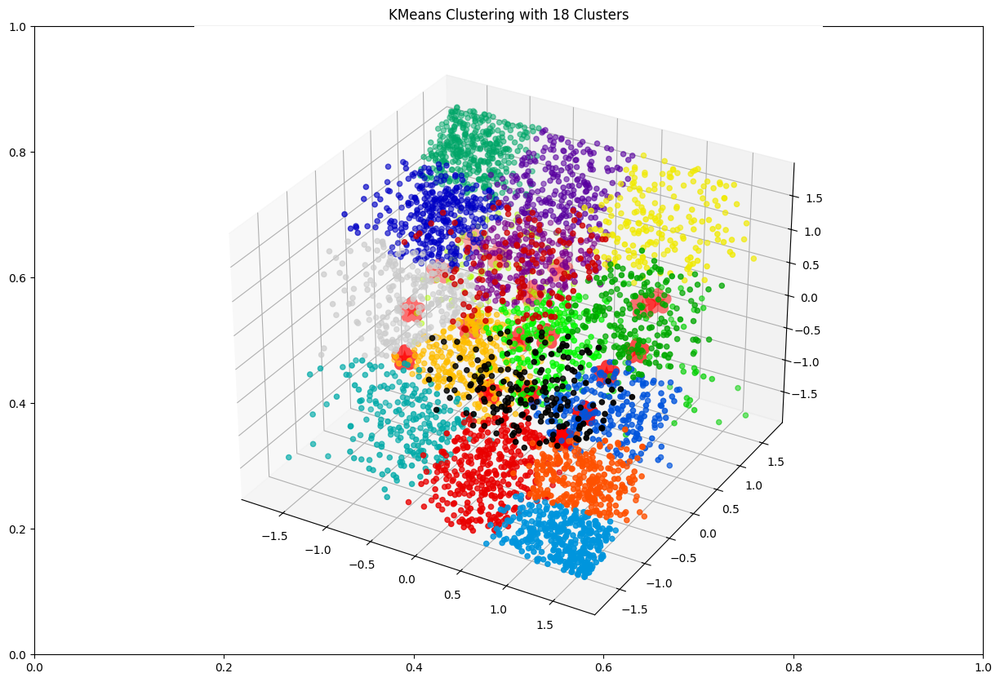

For n_clusters = 19 The average silhouette_score is : 0.2779027326057788


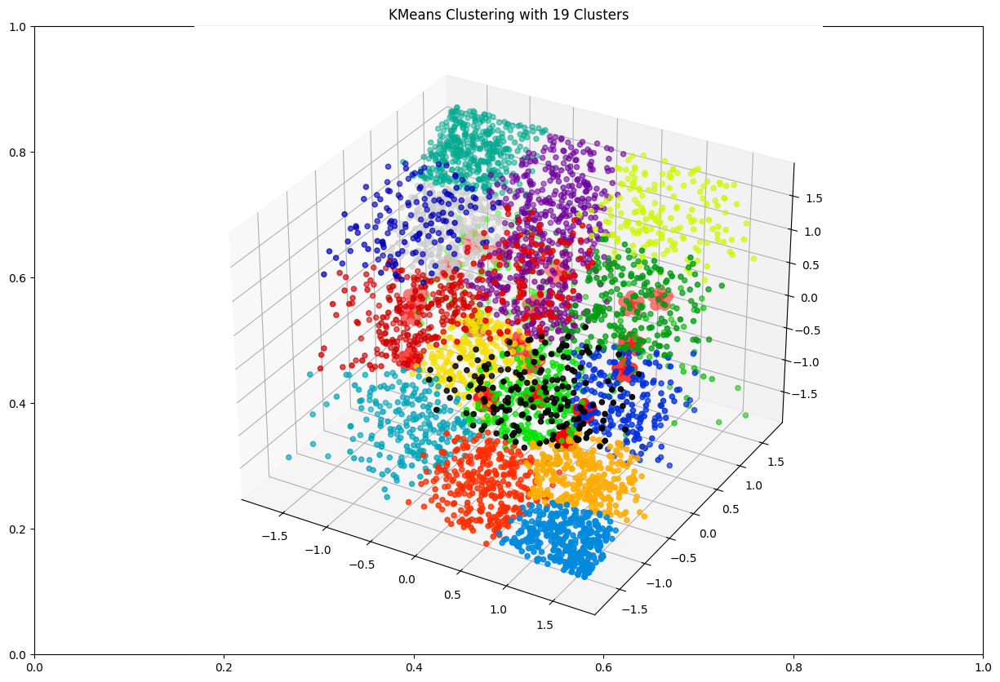

In [43]:
range_n_clusters = range(2,20)

for n_clusters in range_n_clusters:

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    centers = clusterer.cluster_centers_

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Plot scatter plot of the clusters
    fig, ax = plt.subplots()
    fig.set_size_inches(15, 10)
    #ax.scatter(X.iloc[:, 0], X.iloc[:, 1], c=cluster_labels, cmap=plt.cm.nipy_spectral)
    ax = plt.axes(projection ='3d')
   # plt.scatter(X[:, 0], X[:, 1],  X[:, 2],c=clusterer, s=50, cmap='spring')

    ax.scatter(X.iloc[:, 0], X.iloc[:, 1],  X.iloc[:, 2], c=cluster_labels,cmap=plt.cm.nipy_spectral)
    ax.scatter(centers[:, 0], centers[:, 1], marker='*', s=200,
                    linewidths=10, color='red', zorder=10)
    ax.set_title("KMeans Clustering with {} Clusters".format(n_clusters))
    plt.show()


In [54]:

# Visualizing evaluation Metric Score chart
silhouette_avg = silhouette_score(X, y_kmeans)
print("For n_clusters =", 2,
          "The average silhouette_score is :", silhouette_avg)


For n_clusters = 2 The average silhouette_score is : 0.4369026077861595


ML Model - 2 DBSCAN Clustering

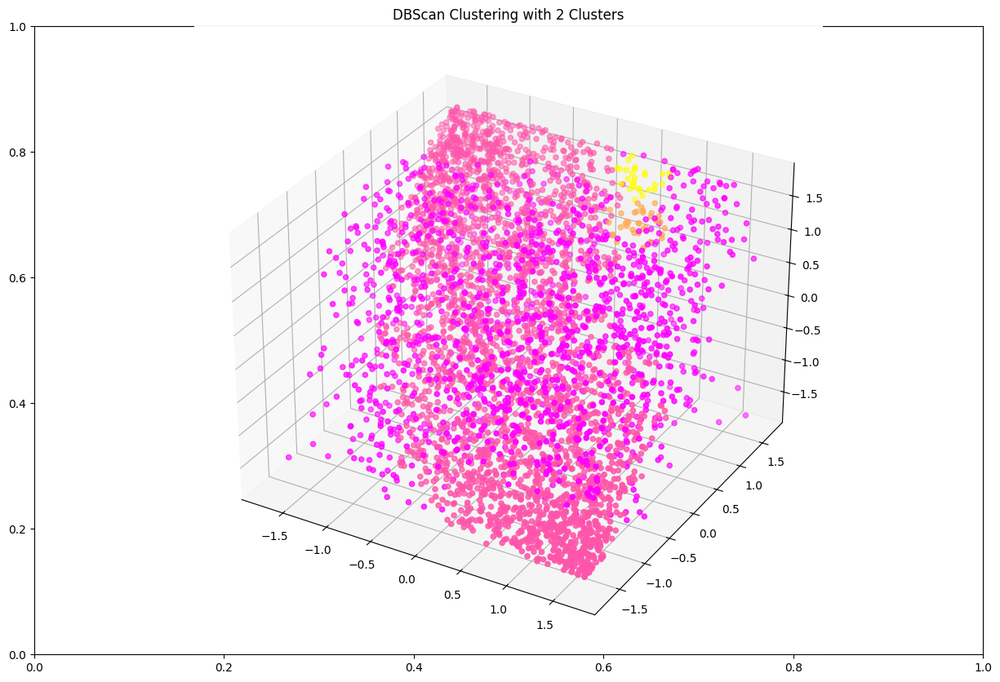

In [55]:

#Fitting DBscan algorithm using DBscan
dbscan = DBSCAN(eps=0.25, min_samples=20)
y_pred = dbscan.fit_predict(X)

#taking cluster labels
clusters = dbscan.labels_
# n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0) # Plot scatter plot of the clusters

fig, ax = plt.subplots()
fig.set_size_inches(15, 10) # setting fig.size

ax = plt.axes(projection ='3d') #setting projection as "3d"

ax.scatter(X.iloc[:, 0], X.iloc[:, 1],  X.iloc[:, 2], c=y_pred,cmap='spring') # scatter plot for R F M

ax.set_title("DBScan Clustering with 2 Clusters")
plt.show()

ML Model - 3 Agglomerative Hierarchical Clustering

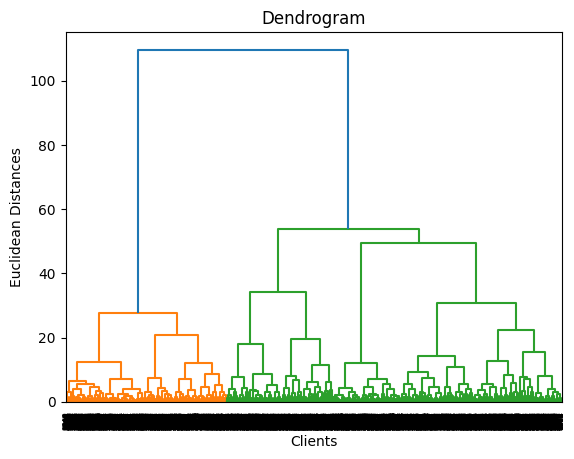

In [56]:
# ML Model - 3 Implementation

# Fit the Algorithm
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram')#title for dendrogram
plt.xlabel('Clients') # xlabel for plot
plt.ylabel('Euclidean Distances')# ylabel for
#plt.axhline(y=200, color='r', linestyle='--')
plt.show() # find largest vertical distance we can make without crossing any other horizontal line

In [57]:
# Fitting the algorithm using agglomarative clustering
clustering_model = AgglomerativeClustering(n_clusters=2, linkage="ward")
clustering_model.fit(X)
labels = clustering_model.labels_ #  taking cluster label

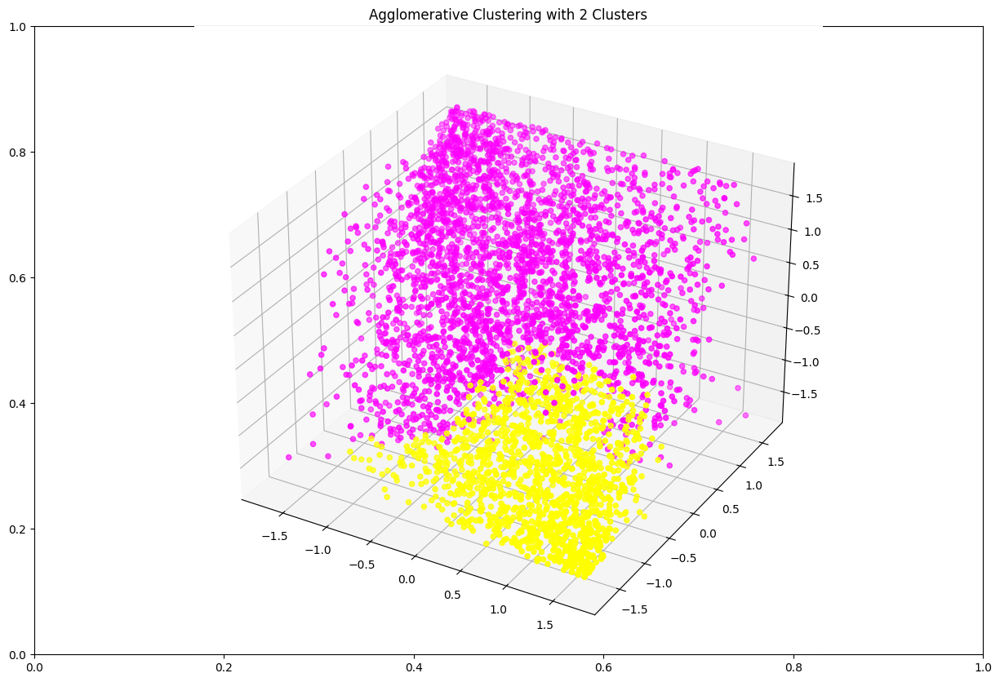

In [58]:

fig, ax = plt.subplots()
fig.set_size_inches(15, 10) # setting fig.size
ax = plt.axes(projection ='3d') #setting projection as 3d
ax.scatter(X.iloc[:, 0], X.iloc[:, 1],  X.iloc[:, 2], c=labels,cmap='spring') # scatter plot for Recency, Frequency, Monetary
ax.set_title("Agglomerative Clustering with 2 Clusters") #setting title for plot
plt.show()

In [59]:
df_RFM["Cluster"]=labels # setting cluster label as per agglomarative clustering to each datapoint

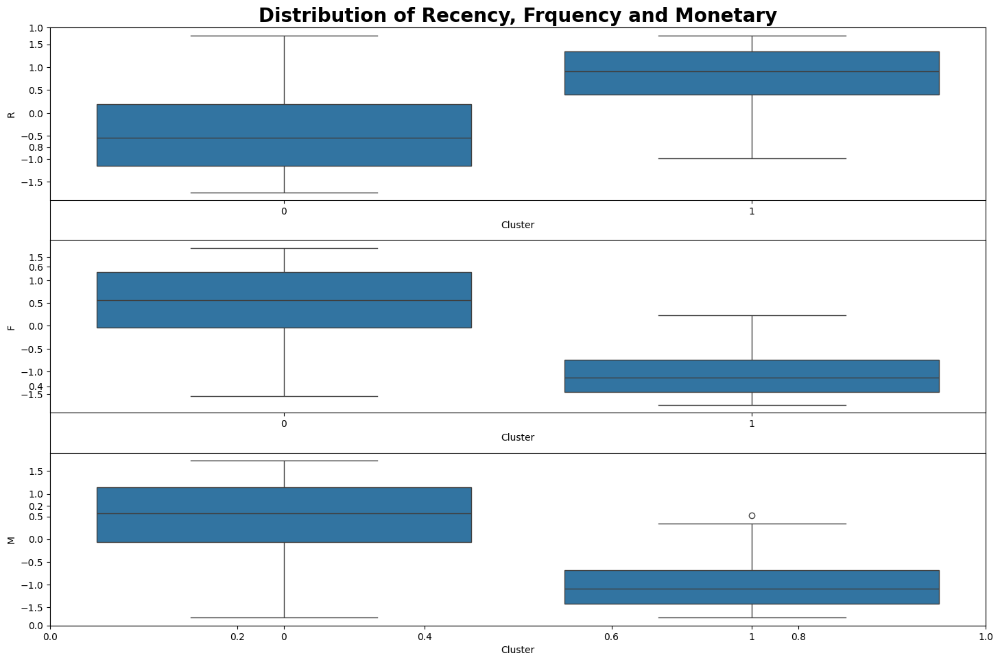

In [60]:
plt.figure(figsize=(15,10))# set the fig. size
# Set the plot title
plt.title('Distribution of Recency, Frquency and Monetary', size=20, fontweight='bold')
# Plot the distribution of recency data
plt.subplot(3, 1, 1)
sns.boxplot(df_RFM,x="Cluster",y="R" )

# plot the distribution of frequency data
plt.subplot(3, 1, 2)
sns.boxplot(df_RFM,x="Cluster",y="F" )

# plot the distribution of Monetary data
plt.subplot(3, 1, 3)
sns.boxplot(df_RFM,x="Cluster",y="M" )
plt.tight_layout()


Observation:-
* Cluster 0 has lower recency (more recent purchases), higher frequency, and higher monetary value, while Cluster 1 has higher recency (less recent purchases), lower frequency, and lower monetary value.

In [61]:
df_RFM

,CustomerID,R,F,M,Cluster
0,12346,-1.604001,1.703396,-1.724466,0
1,12347,1.623561,-1.324154,-1.464998,1
2,12348,-0.412777,0.265070,-0.930893,0
3,12349,0.807988,-0.592017,-0.912530,1
4,12350,-1.548511,0.867866,0.740083,0
...,...,...,...,...,...
4334,18280,-1.450706,1.235531,1.275786,0
4335,18281,-1.046313,1.407587,1.648622,0
4336,18282,1.297811,1.118565,1.291753,0
4337,18283,1.473860,-1.707388,-1.034680,1


In [62]:
df_RFM['Cluster'].value_counts(normalize=True)

,proportion
Cluster,
0,0.67504
1,0.32496


Observation:-
* Cluster 0 contains 67.5% of the data, while Cluster 1 has 32.5%, indicating an imbalanced distribution.

In [63]:
x=df_RFM.drop("Cluster",axis=1)
y=df_RFM["Cluster"]

In [64]:
# Splitting the dataset into the Training set and Test set in 80:20 ratio
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 0,shuffle=True,stratify=y)
# describes info about train and test set
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)


Number transactions X_train dataset:  (3471, 4)
Number transactions y_train dataset:  (3471,)
Number transactions X_test dataset:  (868, 4)
Number transactions y_test dataset:  (868,)


In [65]:

# ML Model - 1 Implementation

# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV)
model = LogisticRegression(max_iter=10000)
solvers = ['lbfgs']
penalty = ['l2',  None]
c_values = [1000,100, 10, 1.0, 0.1, 0.01,0.001,0.0001]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='recall',error_score=0)

# Fit the Algorithm
grid_result=grid_search.fit(X_train, y_train)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


# Predict on the model
# Get the predicted classes
train_class_preds = grid_result.predict(X_train)
test_class_preds = grid_result.predict(X_test)



Best: 0.922285 using {'C': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}


In [67]:

# Get the accuracy scores
train_accuracy = accuracy_score(train_class_preds,y_train)
test_accuracy = accuracy_score(test_class_preds,y_test)

print("The accuracy on train data is ", round(train_accuracy*100,2),"%")
print("The accuracy on test data is ", round(test_accuracy*100,2),"%")


The accuracy on train data is  95.02 %
The accuracy on test data is  93.89 %


[[2256   87]
 [  86 1042]]


Text(0.5, 1.0, 'Confusion Matrix')

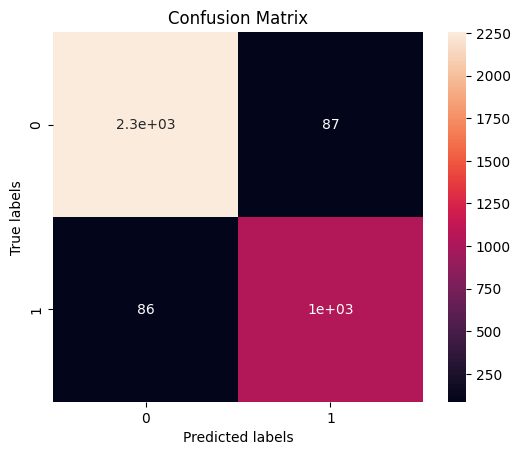

In [68]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for both train


cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax,square=True) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')


[[559  27]
 [ 26 256]]


Text(0.5, 1.0, 'Confusion Matrix')

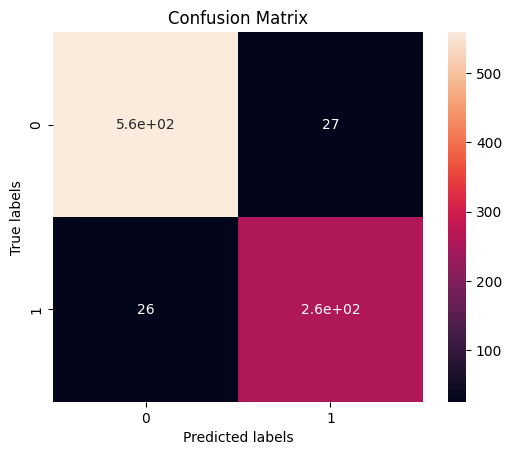

In [69]:
# labels = ['No_risk_tenCHYD', 'Risk_tenCHYD']
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax,square=True); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
# ax.xaxis.set_ticklabels(labels)
# ax.yaxis.set_ticklabels(labels)


In [70]:
print(metrics.classification_report(train_class_preds, y_train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_train, train_class_preds))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2342
           1       0.92      0.92      0.92      1129

    accuracy                           0.95      3471
   macro avg       0.94      0.94      0.94      3471
weighted avg       0.95      0.95      0.95      3471

 
roc_auc_score
0.9433134915229611


In [71]:
print(metrics.classification_report(test_class_preds, y_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y_test, test_class_preds))

              precision    recall  f1-score   support

           0       0.95      0.96      0.95       585
           1       0.91      0.90      0.91       283

    accuracy                           0.94       868
   macro avg       0.93      0.93      0.93       868
weighted avg       0.94      0.94      0.94       868

 
roc_auc_score
0.9308631665577421


##Summary:

In [73]:
from prettytable import PrettyTable

# Specify the Column Names while initializing the Table
myTable = PrettyTable(["Metrics", "Train Data", "Test Data"])

# Add rows
myTable.add_row(["Accuracy", "95.02", "93.89"])
myTable.add_row(["Precision class 0 ", "0.96", "0.95"])
myTable.add_row(["Recall class 0", "0.96", "0.96"])
myTable.add_row(["F1- Score class 0", "0.96", "0.95"])
myTable.add_row(["Precision class 1 ", "0.92", "0.91"])
myTable.add_row(["Recall class 1", "0.92", "0.90"])
myTable.add_row(["F1- Score class 1", "0.92", "0.91"])
myTable.add_row(["Roc_auc_score", "0.9433", "0.9308"])


print(myTable)

+--------------------+------------+-----------+
|      Metrics       | Train Data | Test Data |
+--------------------+------------+-----------+
|      Accuracy      |   95.02    |   93.89   |
| Precision class 0  |    0.96    |    0.95   |
|   Recall class 0   |    0.96    |    0.96   |
| F1- Score class 0  |    0.96    |    0.95   |
| Precision class 1  |    0.92    |    0.91   |
|   Recall class 1   |    0.92    |    0.90   |
| F1- Score class 1  |    0.92    |    0.91   |
|   Roc_auc_score    |   0.9433   |   0.9308  |
+--------------------+------------+-----------+
